# 1 - Perkenalan

Milestone 1\
\
Nama    : Yuzal Qushoyyi Wahyudi\
Batch   : RMT - 033\
Link Tableu: https://public.tableau.com/app/profile/yuzal.qushoyyi.wahyudi/viz/Milestone1_yuzal/Story1 \
Objektif: Meningkatkan kepuasan pelanggan terhadap service yang diberikan oleh Maskapai



# 2 - Identifikasi Masalah

`SMART FRAMEWORK`

1. **Specific**: Mengetahui faktor kepuasan pelanggan terhadap maskapai penerbangan.
2. **Measureable**: Meningkatkan kepuasan rata-rata pelanggan menjadi 1/10.
3. **Achievable**: Menentukan strategi dapat meningkatkan kepuasan rata-rata pelanggan maskapai menjadi 1/10.
4. **Relevant**: Meningkatkan kepuasan pelanggan akan meningkatkan popularitas maskapai sehingga banyak pelanggan yang akan mencoba maskapai tersebut.
5. **Time-Bound**: Akan dicapai di tahun depan.

`PROBLEM STATEMENT`

Dengan tujuan untuk meningkatkan kepuasan pelanggan terhadap maskapai penerbangan, dengan target menaikkan kepuasan pelanggan hingga 1/10. Tujuan ini dicapai dengan menentukan strategi untuk meningkatkan kepuasan pelanggan sehingga meningkatkan popularitas maskapai. Peningkatan popularitas akan membawa banyak pelanggan untuk mencoba maskapai penerbangan. 

`BREAKING DOWN THE PROBLEM`

- Faktor apa saja yang mempengaruhi kepuasan pelanggan?
- Berapa perbandingan antara pelanggan yang puas dengan tidak puas?
- Bagaimana umur berpengaruh terhadap tingkat kepuasan?
- Bagaimana dampak delay terhadap kepuasan pelanggan?
- Bagaimana hubungan Class dengan flight distance?
- Berapa rata - rata rating antara satisfied dengan neutral or dissatisfied?
- Pada bagian servis apa yang perlu ditingkatkan?

# 3 - Data Loading

## 3.1 - Import Library

In [1]:
# Import Modul
import pandas as pd
from scipy import stats
from scipy.stats import ttest_ind, chi2_contingency, f_oneway
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

## 3.2 - Load Data

In [2]:
# Load Data
df = pd.read_csv("airline_passenger_satisfaction.csv")
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


## 3.3 - Deskripsi Data

`ID`  :Unique passenger identifier\
`Gender`  :Gender of the passenger (Female/Male)\
`Age`     :Age of the passenger\
`Customer Type`   :Type of airline customer (First-time/Returning)\
`Type of Travel`  :Purpose of the flight (Business/Personal)\
`Class`   :Travel class in the airplane for the passenger seat\
`Flight Distance` :Flight distance in miles\
`Departure Delay` :Flight departure delay in minutes\
`Arrival Delay`   :Flight arrival delay in minutes\
`Departure and Arrival Time Convenience`  :Satisfaction level with the convenience of the flight departure and arrival times from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Ease of Online Booking`  :Satisfaction level with the online booking experience from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Check-in Service`    :Satisfaction level with the check-in service from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Online Boarding` :Satisfaction level with the online boarding experience from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Gate Location`   :Satisfaction level with the gate location in the airport from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`On-board Service`    :Satisfaction level with the on-boarding service in the airport from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Seat Comfort`    :Satisfaction level with the comfort of the airplane seat from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Leg Room Service`    :Satisfaction level with the leg room of the airplane seat from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Cleanliness`	:Satisfaction level with the cleanliness of the airplane from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Food and Drink`	:Satisfaction level with the food and drinks on the airplane from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`In-flight Service`	:Satisfaction level with the in-flight service from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`In-flight Wifi Service`	:Satisfaction level with the in-flight Wifi service from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`In-flight Entertainment`	:Satisfaction level with the in-flight entertainment from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Baggage Handling`	:Satisfaction level with the baggage handling from the airline from 1 (lowest) to 5 (highest) - 0 means "not applicable"\
`Satisfaction`	:Overall satisfaction level with the airline (Satisfied/Neutral or unsatisfied)


## 3.4 - Check Data

In [17]:
# Check Data Deskrip
df.describe()

,ID,Age,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
count,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000
mean,64940.500000,39.427957,1190.316392,14.713713,15.091129,3.057599,2.756876,3.306267,3.252633,2.976925,3.383023,3.441361,3.350878,3.286326,3.204774,3.642193,2.728696,3.358077,3.632114
std,37493.270818,15.119360,997.452477,38.071126,38.465650,1.526741,1.401740,1.266185,1.350719,1.278520,1.287099,1.319289,1.316252,1.313682,1.329933,1.176669,1.329340,1.334049,1.180025
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,32470.750000,27.000000,414.000000,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,3.000000
50%,64940.500000,40.000000,844.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,4.000000
75%,97410.250000,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,5.000000
max,129880.000000,85.000000,4983.000000,1592.000000,1584.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [18]:
# Melihat Informasi Data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   ID                                      129880 non-null  int64  
 1   Gender                                  129880 non-null  object 
 2   Age                                     129880 non-null  int64  
 3   Customer Type                           129880 non-null  object 
 4   Type of Travel                          129880 non-null  object 
 5   Class                                   129880 non-null  object 
 6   Flight Distance                         129880 non-null  int64  
 7   Departure Delay                         129880 non-null  int64  
 8   Arrival Delay                           129487 non-null  float64
 9   Departure and Arrival Time Convenience  129880 non-null  int64  
 10  Ease of Online Booking                  1298

In [19]:
# Melihat data yang null
df.isnull().sum()

ID                                          0
Gender                                      0
Age                                         0
Customer Type                               0
Type of Travel                              0
Class                                       0
Flight Distance                             0
Departure Delay                             0
Arrival Delay                             393
Departure and Arrival Time Convenience      0
Ease of Online Booking                      0
Check-in Service                            0
Online Boarding                             0
Gate Location                               0
On-board Service                            0
Seat Comfort                                0
Leg Room Service                            0
Cleanliness                                 0
Food and Drink                              0
In-flight Service                           0
In-flight Wifi Service                      0
In-flight Entertainment           

Temuan:

- Dari informasi data didapatkan terdapat 129880 baris dan 24 kolom
- Dari 24 kolom, 14 kolom yang merupakan kolom rating untuk maskapai
- Di kolom Arrival Delay terdapat 393 data yang tidak memiliki nilai atau `None`

Langkah selanjutnya melakukakan cleaning data terhadap kolom Arrival Delay

# 4 - Data Cleaning

In [3]:
# Merubah nilai None menjadi 0
df['Arrival Delay'] = df['Arrival Delay'].replace(np.nan, '0').replace('','0') 
df['Arrival Delay'] = df['Arrival Delay'].astype("int64") # Merubah data menjadi tipe int

In [21]:
df.head()

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1,3,...,3,4,4,5,4,3,3,3,3,Satisfied


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   ID                                      129880 non-null  int64 
 1   Gender                                  129880 non-null  object
 2   Age                                     129880 non-null  int64 
 3   Customer Type                           129880 non-null  object
 4   Type of Travel                          129880 non-null  object
 5   Class                                   129880 non-null  object
 6   Flight Distance                         129880 non-null  int64 
 7   Departure Delay                         129880 non-null  int64 
 8   Arrival Delay                           129880 non-null  int64 
 9   Departure and Arrival Time Convenience  129880 non-null  int64 
 10  Ease of Online Booking                  129880 non-null 

Deskrip:\
\
Data pada kolom arrival delay telah diganti dengan 0, dengan alasan mungkin ada pelanggan yang tidak mengisi atau terlewatkan. Jadi diasumsikan sebagai 0

## 4.1 - Save Data Cleaning

In [24]:
# Save Data yang sudah bersih
df.to_csv("clean_airplane_passenger_satisfaction.csv", index=False)

# 5 - Analisis dan Perhitungan

## 5.1 - Faktor apa saja yang mempengaruhi kepuasan pelanggan?

In [4]:
# Read Data Clean
df = pd.read_csv("clean_airplane_passenger_satisfaction.csv")

In [74]:
# Melakukan ChiSquare terhadap Satisfaction
categorical_cols = df.drop(['Age','Flight Distance','Departure Delay','Arrival Delay'],axis=1).columns

for col in categorical_cols:
    if col != 'Satisfaction':
        cross = pd.crosstab(df[col], df['Satisfaction'])
        chi2, pval, dof, expected = stats.chi2_contingency(cross)
        prompt = "and they are dependent" if pval < 0.05 else ""
        print(f"P-value of {col} and Satisfaction: {pval} {prompt}")

P-value of ID and Satisfaction: 0.49869541356125585 
P-value of Gender and Satisfaction: 5.259838493340003e-05 and they are dependent
P-value of Customer Type and Satisfaction: 0.0 and they are dependent
P-value of Type of Travel and Satisfaction: 0.0 and they are dependent
P-value of Class and Satisfaction: 0.0 and they are dependent
P-value of Departure and Arrival Time Convenience and Satisfaction: 9.767302052551637e-128 and they are dependent
P-value of Ease of Online Booking and Satisfaction: 0.0 and they are dependent
P-value of Check-in Service and Satisfaction: 0.0 and they are dependent
P-value of Online Boarding and Satisfaction: 0.0 and they are dependent
P-value of Gate Location and Satisfaction: 0.0 and they are dependent
P-value of On-board Service and Satisfaction: 0.0 and they are dependent
P-value of Seat Comfort and Satisfaction: 0.0 and they are dependent
P-value of Leg Room Service and Satisfaction: 0.0 and they are dependent
P-value of Cleanliness and Satisfaction:

In [75]:
# Numerikal kolom
numerical_cols = ['Age','Flight Distance','Departure Delay','Arrival Delay']

# Membuat DataFrame kosong untuk menyimpan hasil
correlation_results = pd.DataFrame(columns=['Feature', 'tau-correlation', 'p-value', 'korelasi'])

# Menghitung korelasi Kendalltau untuk setiap kolom numerikal dengan 'default_payment_next_month'
results = []
for col in numerical_cols:
    corr_tau, pval_k = stats.kendalltau(df[col], df['Satisfaction'])
    korelasi = 'Yes' if pval_k < 0.05 else 'No'
    results.append({'Feature': col, 'tau-correlation': corr_tau, 'p-value': pval_k, 'korelasi': korelasi})

correlation_results = pd.DataFrame(results)

# Mengurutkan hasil korelasi dari tinggi ke rendah berdasarkan tau-correlation
correlation_results = correlation_results.sort_values(by='tau-correlation', ascending=True)

# Menampilkan tabel hasil
correlation_results

c:\Users\yuzal\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:5278: RuntimeWarning: overflow encountered in scalar multiply
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


,Feature,tau-correlation,p-value,korelasi
3,Arrival Delay,-0.090034,7.484949e-286,Yes
2,Departure Delay,-0.061943,3.094703e-136,Yes
0,Age,0.118481,0.000000e+00,Yes
1,Flight Distance,0.209575,0.000000e+00,Yes


Insight:\
\
Semua data memiliki keterkaitan dengan satisfaction, namun untuk data `Flight Distance, Departure Delay dan Arrival Delay` masih belum bisa dikatakan memiliki hubungan perlu dilakukan korelasi kendall agar dapat mengetahui korelasi dengan satisfaction.

## 5.2 - Berapa perbandingan antara pelanggan yang puas dengan tidak puas?

In [8]:
# Melakukan value counts terhadap Satisfaction
df['Satisfaction'].value_counts()

Neutral or Dissatisfied    73452
Satisfied                  56428
Name: Satisfaction, dtype: int64

In [79]:
# Membuat plot histogram untuk kolom satisfaction
fig = px.histogram(df, x="Satisfaction", color="Satisfaction",
                    title = "Satisfaction",
                    labels={"Satisfaction": "Satisfaction", "count": "Count"},
                    category_orders={"Satisfaction":[0,1]})

fig.show()

Insight:\
\
Diketahui bahwa pelanggan yang `Neutral or Dissatisfied` memiliki nilai yang lebih tinggi dibandingkan `Satisfied`. Kemungkinan kebanyakan dari pelanggan mengalami ketidakpuasan akibat servis yang diberikan. Langkah selanjutnya melakukan analisis mengenai Kepuasan Pelanggan.

## 5.3 - Bagaimana umur berpengaruh terhadap tingkat kepuasan?

Membuat kolom total rating

In [78]:
## Menentukan kolom dari indeks ke-9 hingga ke-23
rating_columns = df.iloc[:, 9:24]

# Memastikan kolom-kolom rating memiliki tipe data numerik
rating_columns = rating_columns.apply(pd.to_numeric, errors='coerce')

# Menghitung rata-rata rating untuk setiap baris
df['Rata-rata Rating'] = rating_columns.mean(axis=1)

Membuat kolom kategori umur

In [79]:
bins = [0, 11, 26, 46, 66, 100]  # Sesuaikan dengan rentang umur yang paling besar
labels = ['Kanak-kanak', 'Remaja', 'Dewasa', 'Lansia', 'Lansia']

# Menambahkan kolom baru 'Age Category' ke dalam DataFrame
df['Age Category'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False, ordered=False)

# Menampilkan DataFrame untuk memastikan kolom baru telah ditambahkan tanpa nilai null
print(df)

            ID  Gender  Age Customer Type Type of Travel         Class  \
0            1    Male   48    First-time       Business      Business   
1            2  Female   35     Returning       Business      Business   
2            3    Male   41     Returning       Business      Business   
3            4    Male   50     Returning       Business      Business   
4            5  Female   49     Returning       Business      Business   
...        ...     ...  ...           ...            ...           ...   
129875  129876    Male   28     Returning       Personal  Economy Plus   
129876  129877    Male   41     Returning       Personal  Economy Plus   
129877  129878    Male   42     Returning       Personal  Economy Plus   
129878  129879    Male   50     Returning       Personal  Economy Plus   
129879  129880  Female   20     Returning       Personal  Economy Plus   

        Flight Distance  Departure Delay  Arrival Delay  \
0                   821                2            

Menggunakan Anova Test\
\
H0 = Tidak ada perbedaan yang signifikan antar group\
H1 = Ada perbedaan yang signifikan antar group

In [80]:
# Mengambil kolom Age Category berdasarkan Rata-rata Rating
Kanak = df['Rata-rata Rating'][df['Age Category']=='Kanak-kanak']
Remaja = df['Rata-rata Rating'][df['Age Category']=='Remaja']
Dewasa = df['Rata-rata Rating'][df['Age Category']=='Dewasa']
Lansia = df['Rata-rata Rating'][df['Age Category']=='Lansia']

# Melakukan Uji ANOVA
res = stats.f_oneway(Kanak, Remaja, Dewasa, Lansia)
print('P-value:',res.pvalue)


P-value: 0.0


Menggunakan Korelasi Kendalltau

In [346]:
# Melakukan Uji Korelasi Kendalltau
corr_tau, pval_k = stats.kendalltau(df['Age'], df['Rata-rata Rating'])
print(f"tau-correlation: {corr_tau:.2f}, p-value: {pval_k}")

tau-correlation: 0.07, p-value: 1.8954310249039514e-299


In [373]:
# Plot Histogram 
fig = px.histogram(df, x="Age Category", color="Satisfaction", barmode="group",
                    title = "Satisfaction",
                    labels={"Satisfaction": "Satisfaction", "count": "Count"},
                    category_orders={"Satisfaction":[0,1]})

fig.show()

Insight:\
\
Dari hasil test Anova didatkan nilai p-value sebesar 0.0 yang artinya < 0.05\
Menunjukkan bahwa terdapat perbedaan yang signifikan antara kanak, remaja, dewasa dan lansia. Perbedaan ini didasarkan pada rating service maskapai penerbangan, kemungkinan perbedaan ini didasarkan juga pada masing masing experience pelanggan.\
\
Kemudian melakukan korelasi Kendalltau antara umur dengan rata-rata rating didapatkan nilai tau-corr sebesar 0.07 dan p-value sebesar 1.8954310249039514e-299 yang menunjukkan hasil observasi tidak mungkin terjadi secara kebetulan, ada chance terikat antara umur dengan rata-rata rating. Langkah selanjutnya akan dicari tahu mengenai service mana saja yang memiliki rating terburuk.

In [297]:
# Save Data baru setelah perubahan
df.to_csv("perubahan_airplane_passenger_satisfaction.csv", index=False)

## 5.4 - Bagaimana dampak delay terhadap kepuasan pelanggan?

### Arrival Delay

In [5]:
# Uji Korelasi Kendalltau antara Arrival Delay dengan Satisfaction
corr_tau, pval_k = stats.kendalltau(df['Satisfaction'], df['Arrival Delay'])
print(f"tau-correlation: {corr_tau:.2f}, p-value: {pval_k}")

tau-correlation: -0.09, p-value: 7.484948984143093e-286


c:\Users\yuzal\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:5278: RuntimeWarning: overflow encountered in scalar multiply
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


In [7]:
# Central Tendency
print("Mean dari Arrival Delay:", df['Arrival Delay'].mean())
print("Median dari Arrival Delay:", df['Arrival Delay'].median())
print("Modus dari Arrival Delay:", df['Arrival Delay'].mode().values[0])
print("Max dari Arrival Delay:", df['Arrival Delay'].max())
print("Min dari Arrival Delay:", df['Arrival Delay'].min())

# Perhitungan Dispersi
print("")
print("Skewness dari Arrival Delay:", df['Arrival Delay'].skew())
print("Standar Deviasi dari Arrival Delay:", df['Arrival Delay'].std())

Mean dari Arrival Delay: 15.045465044656606
Median dari Arrival Delay: 0.0
Modus dari Arrival Delay: 0
Max dari Arrival Delay: 1584
Min dari Arrival Delay: 0

Skewness dari Arrival Delay: 6.6789571446818705
Standar Deviasi dari Arrival Delay: 38.416352716395906


In [43]:
df[(df['Arrival Delay'] )& (df['Satisfaction']=='Neutral or Dissatisfied')].count().mean()

17691.0

In [46]:
df[(df['Departure Delay'] )& (df['Satisfaction']=='Satisfied')].count().mean()

11898.0

In [56]:
df.loc[(df['Departure Delay'] )& (df['Satisfaction']=='Neutral or Dissatisfied')].count().mean()

17387.0

In [50]:
# Melakukan value counts terhadap Satisfaction
df['Satisfaction'].value_counts()

Satisfaction
Neutral or Dissatisfied    73452
Satisfied                  56428
Name: count, dtype: int64

In [83]:
dep_del = df['Departure Delay'][df['Satisfaction']=='Satisfied']
dep_del.mean()

12.509782377543063

In [85]:
arr_del = df['Arrival Delay'][df['Satisfaction']=='Satisfied']
arr_del.mean()

12.496987311263911

In [84]:
dep_del_n = df['Departure Delay'][df['Satisfaction']=='Neutral or Dissatisfied']
dep_del_n.mean()

16.406837118117956

In [86]:
arr_del_n = df['Arrival Delay'][df['Satisfaction']=='Neutral or Dissatisfied']
arr_del_n.mean()

17.00328105429396

In [21]:
# Melakukan pengecekan Value Arrival Delay terhadap Satisfaction
pd.crosstab(df['Arrival Delay'], df['Satisfaction'])

Satisfaction,Neutral or Dissatisfied,Satisfied
Arrival Delay,,
0,38490,34656
1,1418,1329
2,1374,1213
3,1256,1186
4,1237,1136
...,...,...
970,1,0
1011,0,1
1115,1,0


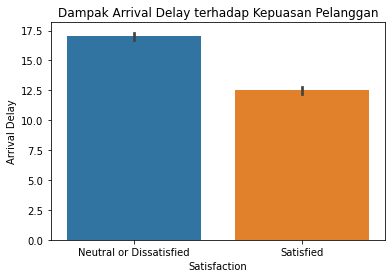

In [273]:
# Membuat barplot antara Arrival Delay dengan Satisfaction
sns.barplot(x='Satisfaction', y='Arrival Delay', data=df)
plt.title('Dampak Arrival Delay terhadap Kepuasan Pelanggan')
plt.xlabel('Satisfaction')
plt.ylabel('Arrival Delay')
plt.show()

### Departure Delay

In [369]:
# Uji Korelasi Kendalltau antara Departure Delay dengan Satisfaction
corr_tau, pval_k = stats.kendalltau(df['Satisfaction'], df['Departure Delay'])
print(f"tau-correlation: {corr_tau:.2f}, p-value: {pval_k}")

tau-correlation: -0.06, p-value: 3.094703330570057e-136


In [298]:
# Melakukan pengecekan Value Departure Delay terhadap Satisfaction
pd.crosstab(df['Departure Delay'], df['Satisfaction']).count()

Satisfaction
Neutral or Dissatisfied    466
Satisfied                  466
dtype: int64

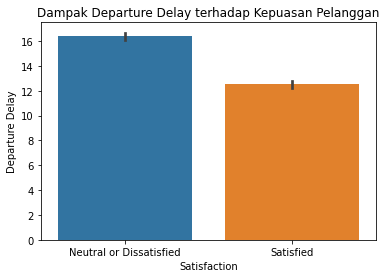

In [272]:
# Membuat barplot antara Departure Delay dengan Satisfaction
sns.barplot(x='Satisfaction', y='Departure Delay', data=df)
plt.title('Dampak Departure Delay terhadap Kepuasan Pelanggan')
plt.xlabel('Satisfaction')
plt.ylabel('Departure Delay')
plt.show()

Insight:\
\
Ketika dilakukan uji korelasi kendalltau terhadap Satisfaction didapatkan nilai untuk Arrival Delay tau-correlation: -0.09, p-value: 7.484948984144798e-286 dan Departure Delay tau-correlation: -0.06, p-value: 3.094703330570057e-136 dari data ini menunjukkan bahwa terdapat keterkaitan antara Arrival Delay, Departure Delay dengan Satisfaction. Artinya Arrival Delay dan Departure Delay ini mempengaruhi penilaian terhadap Satisfaction. Dan dapat dilihat dari barplot bahwa Neutral or Dissatisfied memiliki nilai yang lebih besar dibandingkan Satisfied, maka dari itu semakin banyak arrival delay dan departure delay maka nilai satisfaction akan berpengaruh.

Dan jika dibandingkan antara departure dengan arrival delay. Count value dari Arrival delay sebesar 472 dan departure delay sebesar 466. Menunjukkan bahwa Arrival Delay lebih berdampak kepada pelanggan atau cenderung lebih berdampak dibandingkan departure delay. Namun, tetap harus dilakukan evaluasi untuk departure dan juga arrival pada maskapai.

## 5.5 - Bagaimana hubungan Class dengan flight distance?

In [349]:
# Melihat unik dari class
df['Class'].unique()

array(['Business', 'Economy', 'Economy Plus'], dtype=object)

In [351]:
# Melakukan ANOVA TEST
Business = df['Flight Distance'][df['Class']=='Business']
Economy = df['Flight Distance'][df['Class']=='Economy']
Economy_Plus = df['Flight Distance'][df['Class']=='Economy Plus']

res = stats.f_oneway(Business, Economy, Economy_Plus)
print('P-value:',res.pvalue)

P-value: 0.0


In [359]:
# Melakukan plot histogram antara class dengan flight distance
fig = px.histogram(df, x='Class', y='Flight Distance',
             title='Hubungan Class dengan Flight Distance',
             labels={'Class': 'Class', 'Flight Distance': 'Flight Distance'})
fig.show()

Insigh:\
\
Dilakukan ANOVA TEST terhadap Class dengan Flight distance didapatkan nilai p-value sebesar 0.0 yang artinya terdapat hubungan antara masing masing class yaitu Business, Economy dan Economy Plus terhadap Flight Distance. Dapat disimpulkan bahwa kebanyakan pelanggan jika ingin melakukan penerbangan jarak jauh mereka memesan class yang terbaik bagi mereka yaitu Business class. Dan kemungkinan untuk class economy dapat dikatakan bahwa pelanggan tidak memiliki cukup budget untuk memesan business class atau sengaja menyimpan budget mereka untuk hal yang lebih penting.

## 5.6 - Berapa rata - rata rating antara satisfied dengan neutral or dissatisfied?

In [307]:
# Melihat Rata-rata Rating dari Satisfaction
df.groupby(['Satisfaction']).mean()['Rata-rata Rating']

Satisfaction
Neutral or Dissatisfied    2.953987
Satisfied                  3.615218
Name: Rata-rata Rating, dtype: float64

In [366]:
# Plot histogram Satisfaction dengan Rata-rata Rating
fig = px.histogram(df, x="Satisfaction", y="Rata-rata Rating",
                    title = "Rata-rata Rating terhadap Satisfaction")

fig.show()

Insight:\
\
Diketahui bahwa rata rata rating dari Neutral or Dissatisfied dengan Satisfied ialah 2.9 dan 3.6. Namun dari jumlah rata-rata rating dari Neutral or Dissatisfied lebih banyak dibandingkan Satisfied. Perlu dilakukan evaluasi lebih lanjut mengenai servis apa aja yang perlu ditingkatkan dan dipertahankan.

## 5.7 - Pada bagian servis apa yang perlu ditingkatkan?

In [ ]:
# Drop kolom satisfaction untuk hanya melihat kolom servis
rating_columns = rating_columns.drop(columns='Satisfaction')

In [324]:
# Info Servis
rating_columns.mean()

Departure and Arrival Time Convenience    3.057599
Ease of Online Booking                    2.756876
Check-in Service                          3.306267
Online Boarding                           3.252633
Gate Location                             2.976925
On-board Service                          3.383023
Seat Comfort                              3.441361
Leg Room Service                          3.350878
Cleanliness                               3.286326
Food and Drink                            3.204774
In-flight Service                         3.642193
In-flight Wifi Service                    2.728696
In-flight Entertainment                   3.358077
Baggage Handling                          3.632114
dtype: float64

In [347]:
# Membuat plot histogram
df_service = {
    'Criteria': [
        'Departure and Arrival Time Convenience', 'Ease of Online Booking',
        'Check-in Service', 'Online Boarding', 'Gate Location',
        'On-board Service', 'Seat Comfort', 'Leg Room Service',
        'Cleanliness', 'Food and Drink', 'In-flight Service',
        'In-flight Wifi Service', 'In-flight Entertainment', 'Baggage Handling'
    ],
    'Rating': [
        3.057599, 2.756876, 3.306267, 3.252633, 2.976925,
        3.383023, 3.441361, 3.350878, 3.286326, 3.204774,
        3.642193, 2.728696, 3.358077, 3.632114
    ]
}

# Membuat DataFrame dari data
service_rating = pd.DataFrame(df_service)

# Membuat histogram dengan Plotly Express
fig = px.histogram(service_rating, x='Criteria', y='Rating', title='Histogram of Criteria Ratings',
                   labels={'Criteria': 'Criteria', 'Rating': 'Rating'})

# Mengatur orientasi label sumbu x agar lebih mudah dibaca
fig.update_xaxes(tickangle=45)

# Menampilkan histogram
fig.show()

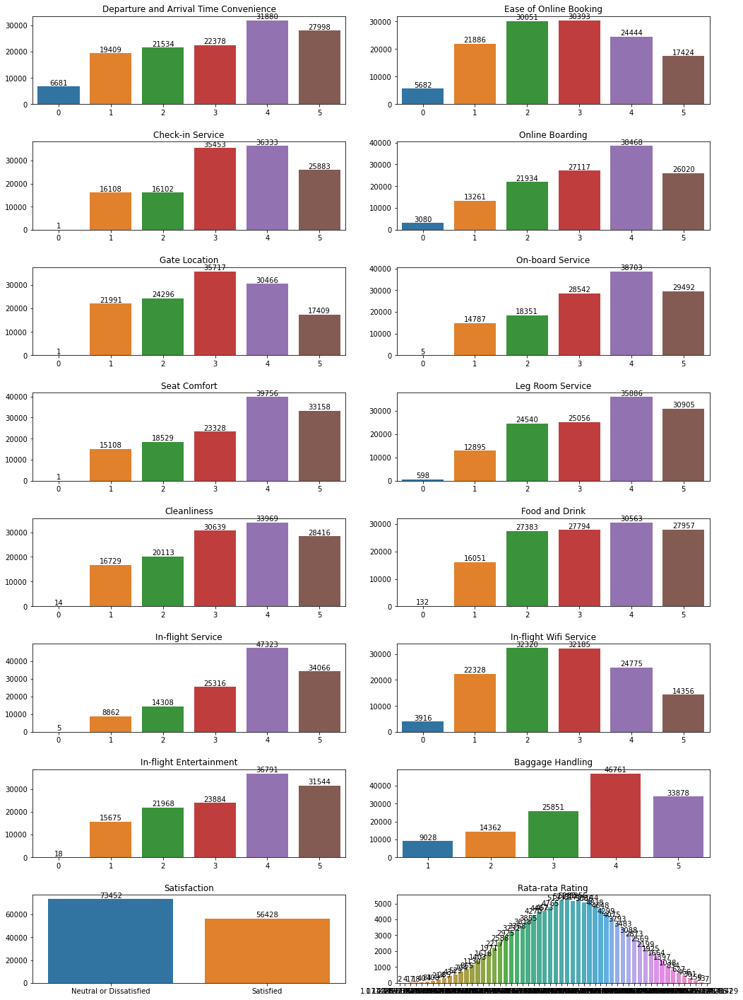

In [370]:
# Melihat bagaimana vote rating servis yang diberikan
services_columns = df.columns[9:-1].tolist()
plt.figure(figsize=(15, 20))

# Looping
for index, col in enumerate(services_columns):
    plt.subplot((len(services_columns) + 1) // 2, 2, index + 1) # Buat sub-plot
    
    graph = sns.countplot(x = col, data = df)
    for container in graph.containers:
        graph.bar_label(container)
        
    plt.title(col, ) # Judul di setiap plot
    graph.set_xlabel("") 
    graph.set_ylabel("") 
 
# set layout antara dua plots
plt.tight_layout(pad = 2)

plt.show()

Insight:\
\
Dari data yang didapatkan bahwa terdapat 5 servis bottom dan 5 servis top.\
Dimulai dari 5 servis bottom yaitu Ease of Online Booking, Gate Location, In-flight Wifi Service, Departure and Arrival Time Convenience, Food and Drink dengan range rating dari 2.7 sampai 3.2. Servis ini perlu dilakukan evaluasi dan improvement agar dapat memperbaiki tingkat kepuasan pelanggan. Lakukan pengecekan secara berkala agar tidak ada yang miss dan semua servis pada bagian ini menunjukkan improvement.\
\
Untuk 5 servis top yaitu Baggage Handling, In-flight Service, Seat Comfort, On-Board Service, dam In-flight Entertainment dengan range rating dari 3.35 sampai 3.6. Serivis ini sudah baik dan harus ditingkatkan lagi agar dapat meningkatkan tingkat kepuasaan pelanggan. Lakukan juga pengecekan secara berkala terhadap servis ini agar tidak ada penurunan dalam servis ini.                         

# 6 -  Kesimpulan

Berdasarkan analisis yang dilakukan, beberapa faktor telah diidentifikasi mempengaruhi kepuasan pelanggan. Berikut ini adalah rekomendasi strategis berdasarkan temuan analisis:

- Perbaikan Servis Terendah: Fokus pada perbaikan servis yang memiliki rating terendah, seperti Ease of Online Booking dan In-flight Wifi Service. Perbaikan ini diharapkan dapat meningkatkan kepuasan pelanggan secara keseluruhan.
- Peningkatan Kualitas untuk Servis Tertinggi: Meskipun servis ini sudah mendapatkan rating tinggi, upaya harus dilakukan untuk mempertahankan dan meningkatkan kualitas servis seperti Baggage Handling dan Seat Comfort.
- Pengelolaan Delay: Mengurangi Arrival Delay dan Departure Delay melalui manajemen waktu yang lebih baik dan peningkatan efisiensi operasional.
- Peningkatan Pengalaman Pelanggan Berdasarkan Kategori Umur: Menyediakan layanan yang lebih terpersonalisasi berdasarkan kategori umur untuk meningkatkan pengalaman pelanggan.
- Penyediaan Kelas Penerbangan yang Nyaman untuk Jarak Jauh: Menawarkan lebih banyak pilihan kelas yang nyaman, terutama untuk penerbangan jarak jauh, untuk memenuhi kebutuhan pelanggan yang berbeda.

Dengan mengikuti rekomendasi ini, maskapai dapat meningkatkan kepuasan pelanggan, yang pada akhirnya akan meningkatkan popularitas dan loyalitas pelanggan terhadap maskapai penerbangan hingga 1/10 pelanggan.
Jika dijabarkan dalam timebound 1 tahun, pada 6 bulan pertama lakukan improvement untuk 5 service terbawah dengan cara melakukan evaluasi dengan melihat rating yang didapat kemudian melakukan trial and error dan langsung meminta feedback dari pelanggan. Hal tersebut akan membantu pengembangan service menjadi lebih baik. Kemudian untuk 6 bulan berikutnya ketika 5 service terbawah tersebut sudah meningkat, lakukan maintain setiap bulan dan tetap melakukan improvement di setiap servicenya. Hal ini dilakukan agar kepuasan pelanggan terhadap maskapai meningkai 1/10 dari sebelumnya.